# About This Kernel

Hi Everyone!!, I am a big fan of the FIFA franchise. I played almost all FIFA games from FIFA 14 to 19. I enjoy this game on my laptop with my friends and brothers, so Now I am enjoying visualization with FIFA 19 dataset. 

This kernel is easily understandable to the beginner like me. This verbosity tries to explain everything I could possibly know. Once you get through the notebook, you can find this useful and straightforward. I attempted to explain things as simple as possible.

In this notebook, I extensively use plotly along with seaborn and matplotlib for data visualization and EDA on  FIFA 19 dataset. 
Keep Learning,

Vikas Singh


* [1. Importing Packages And Collecting Data](#1)
* [2. Variable Description, Identification And Correction](#2)
* [3. Imputing Missing Variable](#3)
* [4. Binning And Grouping](#4)
* [5. Data Preprocessing](#5)
* [6. Dropping Features](#6)
* [7. Univariate Analysis](#7)
* [8. Bivariate Analysis](#8)
  * [8.1. Numerical and Numerical Variable](#8.1)
  * [8.2. Categorical and Numerical Variable](#8.2)
* [9. Multivariate Analysis](#9)
* [10. Top 10 Player](#10)
* [11. References](#11)

# Introduction

FIFA 19 is a football simulation video game developed by EA Vancouver as part of Electronic Arts' FIFA series. It is the 26th installment in the FIFA series, and was released on 28 September 2018 for PlayStation 3, PlayStation 4, Xbox 360, Xbox One, Nintendo Switch, and Microsoft Windows.

As with FIFA 18, Cristiano Ronaldo featured as the cover athlete of the regular edition: however, following his unanticipated transfer from Spanish club Real Madrid to Italian side Juventus, new cover art was released. He also appeared with Neymar in the cover of the Champions edition. From February 2019, an updated version featured Neymar, Kevin De Bruyne and Paulo Dybala on the cover of the regular edition.

The game features the UEFA club competitions for the first time, including the UEFA Champions League and UEFA Europa League and the UEFA Super Cup as well. Martin Tyler and Alan Smith return as regular commentators, while the new commentary team of Derek Rae and Lee Dixon feature in the UEFA competitions mode. Composer Hans Zimmer and rapper Vince Staples recorded a new remix of the UEFA Champions League anthem specifically for the game.

The character Alex Hunter, who first appeared in FIFA 17, returns for the third and final installment of "The Journey", entitled, "The Journey: Champions". In June 2019, a free update added the FIFA Women's World Cup as a separate game mode. It is the last FIFA game to be available on a seventh-generation console, and the last known game to be available for the PlayStation 3 worldwide.


![](https://compass-ssl.xbox.com/assets/5e/5e/5e5e79d1-1ea9-4280-8ead-86dc202122f3.jpg?n=FIFA-19_Multi-Feature-1084_FUT_1600x600.jpg)

# 1. Importing Packages and Collecting Data <a id="1"></a>

In [1]:
'''Importing Data Manipulattion Moduls'''
import numpy as np
import pandas as pd
from scipy import stats

'''Seaborn and Matplotlib Visualization'''
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('bmh')                    
%matplotlib inline

'''plotly Visualization'''
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
init_notebook_mode(connected = True)

'''Display markdown formatted output like bold, italic bold etc.'''
from IPython.display import Markdown

In [2]:
'''Read the dataset from csv file'''
fifa19 = pd.read_csv('../input/fifa19/data.csv')

# 2. Variable Description, Identification and Correction <a id="2"></a>

In [3]:
'''Data at a glance'''
display(fifa19.head())
display(print('Dimension of fifa19:', fifa19.shape))

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


Dimension of fifa19: (18207, 89)


None

In [4]:
"""Let's see all columns in the data"""
display(fifa19.columns.values)

'''I choose intersting columns from the dataframe for analysis'''
chosen_columns = ['Name', 
                  'Age', 
                  'Nationality', 
                  'Overall', 
                  'Potential', 
                  'Club', 
                  'Value', 
                  'Wage', 
                  'Special',
                  'Preferred Foot', 
                  'International Reputation', 
                  'Weak Foot',
                  'Skill Moves', 
                  'Body Type', 
                  'Position',
                  'Jersey Number',
                  'Height', 
                  'Weight', 
                  'Crossing', 'Finishing', 'HeadingAccuracy',
                  'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
                  'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
                  'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
                  'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
                  'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
                  'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                  'GKKicking', 'GKPositioning', 'GKReflexes']

array(['Unnamed: 0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'Club Logo', 'Value', 'Wage',
       'Special', 'Preferred Foot', 'International Reputation',
       'Weak Foot', 'Skill Moves', 'Work Rate', 'Body Type', 'Real Face',
       'Position', 'Jersey Number', 'Joined', 'Loaned From',
       'Contract Valid Until', 'Height', 'Weight', 'LS', 'ST', 'RS', 'LW',
       'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM',
       'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB',
       'RCB', 'RB', 'Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
       'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
       'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
       'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
       'StandingTackle', 'S

In [5]:
'''create new dataframe with chosen columns'''
data = pd.DataFrame(fifa19, columns = chosen_columns)
display(data.head())
display(print('Dimension of data:', data.shape))

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,2202,Left,...,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,2228,Right,...,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,2143,Right,...,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,1471,Right,...,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,2281,Right,...,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0


Dimension of data: (18207, 52)


None

In [6]:
'''Describing the data'''
data.describe()

,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,18159.000000,18159.000000,...,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,45.550911,...,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,18.364524,19.525820,...,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,2.000000,...,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,30.000000,...,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,49.000000,...,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,62.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,95.000000,...,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000


# 3. Imputing Missing variable <a id="3"></a>
***The simpliest way to impute missing values of a variable is to impute its missing values with its mean, median or mode depending on its distribution and variable type(categorical or numerical).***

In [7]:
"""Let's check missing values"""
data.isnull().sum()

Name                          0
Age                           0
Nationality                   0
Overall                       0
Potential                     0
Club                        241
Value                         0
Wage                          0
Special                       0
Preferred Foot               48
International Reputation     48
Weak Foot                    48
Skill Moves                  48
Body Type                    48
Position                     60
Jersey Number                60
Height                       48
Weight                       48
Crossing                     48
Finishing                    48
HeadingAccuracy              48
ShortPassing                 48
Volleys                      48
Dribbling                    48
Curve                        48
FKAccuracy                   48
LongPassing                  48
BallControl                  48
Acceleration                 48
SprintSpeed                  48
Agility                      48
Reaction

Okay!! so we have lots of missing varibles. 
* **For Club variable,** we assume that those player doesn't have any club. so, we impute the missing values with no club.

* **For Position variable,** we are imputing this with 'ST' because 'ST' position is called side midfielder, they are on the left or right-hand side of central midfield. They can also be stationed at a wider position for providing more defensive protection. So, This makes sense.

In [8]:
'''Imputing Club and Position'''
data['Club'].fillna('No Club', inplace = True)
data['Position'].fillna('ST', inplace = True)

In [9]:
'''There are some Discrete and Continuous variable and will be imputed by mean'''
to_impute_by_mean = data.loc[:, ['Crossing', 'Finishing', 'HeadingAccuracy',
                                 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
                                 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
                                 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
                                 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
                                 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
                                 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                                 'GKKicking', 'GKPositioning', 'GKReflexes']]
for i in to_impute_by_mean.columns:
    data[i].fillna(data[i].mean(), inplace = True)

In [10]:
'''These are categorical variables and will be imputed by mode.'''
to_impute_by_mode = data.loc[:, ['Body Type','International Reputation', 'Height', 'Weight', 'Preferred Foot','Jersey Number']]
for i in to_impute_by_mode.columns:
    data[i].fillna(data[i].mode()[0], inplace = True)

In [11]:
'''The following variables are either discrete numerical or continuous numerical variables.So the will be imputed by median.'''
to_impute_by_median = data.loc[:, ['Weak Foot', 'Skill Moves', ]]
for i in to_impute_by_median.columns:
    data[i].fillna(data[i].median(), inplace = True)

In [12]:
'''Columns remaining to be imputed'''
data.columns[data.isna().any()]

Index([], dtype='object')

# 4. Binning and Grouping <a id="4"></a>
***Binning or grouping data (sometimes called quantization) is an important tool in preparing numerical data for machine learning, and is useful in scenarios like these:
A column of continuous numbers has too many unique values to model effectively, so you automatically or manually assign the values to groups, to create a smaller set of discrete ranges. For example, you could use entropy scores generated by Group Data into Bins to identify the optimal groupings of data values, and use those groups as features in your model.***

In [13]:
def general(data):
    return int(round((data[['HeadingAccuracy', 'Dribbling', 'Curve', 
                            'BallControl']].mean()).mean()))

def mental(data):
    return int(round((data[['Aggression', 'Interceptions', 'Positioning', 
                            'Vision','Composure']].mean()).mean()))

def mobility(data):
    return int(round((data[['Acceleration', 'SprintSpeed', 
                            'Agility','Reactions']].mean()).mean()))

def power(data):
    return int(round((data[['Balance', 'Jumping', 'Stamina', 
                            'Strength']].mean()).mean()))

def shooting(data):
    return int(round((data[['Finishing', 'Volleys', 'FKAccuracy', 
                            'ShotPower','LongShots', 'Penalties']].mean()).mean()))

def passing(data):
    return int(round((data[['Crossing', 'ShortPassing', 
                            'LongPassing']].mean()).mean()))

def defending(data):
    return int(round((data[['Marking', 'StandingTackle', 
                            'SlidingTackle']].mean()).mean()))

def goalkeeping(data):
    return int(round((data[['GKDiving', 'GKHandling', 'GKKicking', 
                            'GKPositioning', 'GKReflexes']].mean()).mean()))

def rating(data):
    return int(round((data[['Potential', 'Overall']].mean()).mean()))


In [14]:
'''Adding these categories to the data'''
data['General'] = data.apply(general, axis = 1)
data['Mental'] = data.apply(mental, axis =1)
data['Mobility'] = data.apply(mobility, axis = 1)
data['Power'] = data.apply(power, axis = 1)
data['Shooting'] = data.apply(shooting, axis = 1)
data['Passing'] = data.apply(passing, axis = 1)
data['Defending'] = data.apply(defending, axis =1)
data['Goalkeeping'] = data.apply(goalkeeping, axis = 1)
data['Rating'] = data.apply(rating, axis =1)

# 5. Data Preprocessing <a id="5"></a>

***Before we proceed further, we need to do some preprocessing for variables like*** **Height and Weight** ***and monetary variables like*** **Value and Wage** ***so that they're converted to a numeric format.***

In [15]:
'''Defining a funtion for cleaning Height, Weight, Value and Wage columns'''

'''For weight'''
def extract_value_from(value):
    x = value.replace('lbs', '')
    return float(x)

'''For Height'''
def feet_to_inches(value): 
    tmp = value.split("'")
    return int(tmp[0]) * 12 + int(tmp[1]) #converting feet to inches

'''For Value and wage'''
def convert_currency(value):
    x = value.replace('€', '')
    if 'M' in x:
        x = float(x.replace('M', ''))*100000
    elif 'K' in value:
        x = float(x.replace('K', ''))*1000
    return float(x)

In [16]:
'''Appling the funtion to Height, Weight, Value and Wage columns'''
data['Weight'] = data['Weight'].apply(lambda x: extract_value_from(x))
data['Height'] = data['Height'].apply(lambda x: feet_to_inches(x))
data['Value'] =  data['Value'].apply(lambda x: convert_currency(x))
data['Wage'] =  data['Wage'].apply(lambda x: convert_currency(x))

display(Markdown('**Processed  Height, Weight, Value and Wage columns**'))
display(data[['Weight', 'Height', 'Value', 'Wage']].head(3))

**Processed  Height, Weight, Value and Wage columns**

,Weight,Height,Value,Wage
0,159.0,67,11050000.0,565000.0
1,183.0,74,7700000.0,405000.0
2,150.0,69,11850000.0,290000.0


#### Defining the features of players

In [17]:
# defining the features of players

player_features = ('Acceleration', 'Aggression', 'Agility', 
                   'Balance', 'BallControl', 'Composure', 
                   'Crossing', 'Dribbling', 'FKAccuracy', 
                   'Finishing', 'GKDiving', 'GKHandling', 
                   'GKKicking', 'GKPositioning', 'GKReflexes', 
                   'HeadingAccuracy', 'Interceptions', 'Jumping', 
                   'LongPassing', 'LongShots', 'Marking', 'Penalties')

# Top four features for every position in football

for i, val in data.groupby(data['Position'])[player_features].mean().iterrows():
    print('Position {}: {}, {}, {}'.format(i, *tuple(val.nlargest(4).index)))

Position CAM: Balance, Agility, Acceleration
Position CB: Jumping, Aggression, HeadingAccuracy
Position CDM: Aggression, Jumping, Balance
Position CF: Agility, Balance, Acceleration
Position CM: Balance, Agility, Acceleration
Position GK: GKReflexes, GKDiving, GKPositioning
Position LAM: Agility, Balance, Acceleration
Position LB: Acceleration, Balance, Agility
Position LCB: Jumping, Aggression, HeadingAccuracy
Position LCM: Balance, Agility, BallControl
Position LDM: Aggression, BallControl, LongPassing
Position LF: Balance, Agility, Acceleration
Position LM: Acceleration, Agility, Balance
Position LS: Acceleration, Agility, Finishing
Position LW: Acceleration, Agility, Balance
Position LWB: Acceleration, Agility, Balance
Position RAM: Agility, Balance, Acceleration
Position RB: Acceleration, Balance, Jumping
Position RCB: Jumping, Aggression, HeadingAccuracy
Position RCM: Agility, Balance, BallControl
Position RDM: Aggression, Jumping, BallControl
Position RF: Agility, Acceleration, 

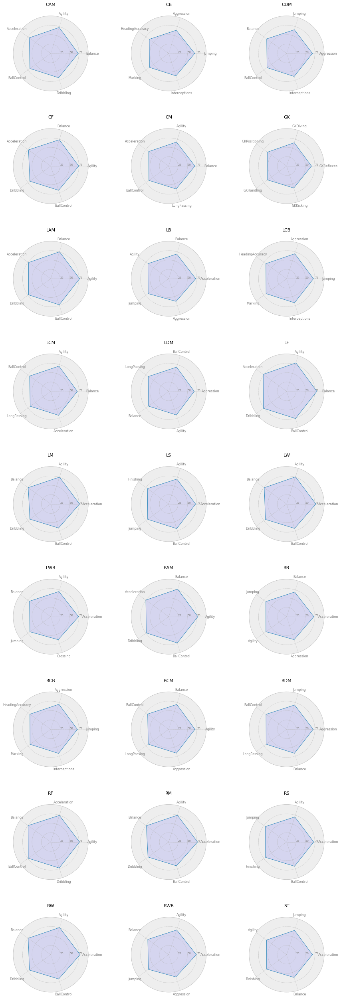

In [18]:
# source: https://www.kaggle.com/dczerniawko/fifa19-analysis 
from math import pi

idx = 1
plt.figure(figsize=(15,45))
for position_name, features in data.groupby(data['Position'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))
    
    # number of variable
    categories=top_features.keys()
    N = len(categories)

    # We are going to plot the first line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values = list(top_features.values())
    values += values[:1]

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(9, 3, idx, polar=True)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([25,50,75], ["25","50","75"], color="grey", size=7)
    plt.ylim(0,100)
    
    plt.subplots_adjust(hspace = 0.5)
    
     # Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')

    # Fill area
    ax.fill(angles, values, 'b', alpha=0.1)
    
    plt.title(position_name, size=11, y=1.1)
    
    idx += 1

# 6. Dropping Features <a id="6"></a>
***Now we have both transformed and the original variables transformation have been made from. So we should safely drop the variables that we think would not be useful anymore.***

In [19]:
"""Let's see all the variables we currently have with their category."""
display(data.head(2))

'''Drop the features that would not be useful anymore.'''
data.drop(columns = ['Crossing', 'Finishing', 'HeadingAccuracy',
                     'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
                     'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
                     'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
                     'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
                     'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
                     'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                     'GKKicking', 'GKPositioning', 'GKReflexes', 'Overall', 'Potential'], inplace = True, axis =1)

'''Features Remaining after Dropping:'''
display(Markdown('**Features Remaining after Dropping:**'))
display(data.columns.values)

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,GKReflexes,General,Mental,Mobility,Power,Shooting,Passing,Defending,Goalkeeping,Rating
0,L. Messi,31,Argentina,94,94,FC Barcelona,11050000.0,565000.0,2202,Left,...,8.0,89,71,91,74,88,87,29,11,94
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,7700000.0,405000.0,2228,Right,...,11.0,88,73,91,83,88,81,27,12,94


**Features Remaining after Dropping:**

array(['Name', 'Age', 'Nationality', 'Club', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Body Type', 'Position', 'Jersey Number', 'Height',
       'Weight', 'General', 'Mental', 'Mobility', 'Power', 'Shooting',
       'Passing', 'Defending', 'Goalkeeping', 'Rating'], dtype=object)

## -- ***<font color=blue>Let's Start the Party</font>*** --

# 7. Univariate Analysis <a id="7"></a>
***Univariate analysis separately explores the distribution of each variable in a data set. It looks at the range of values, as well as the central tendency of the values. Univariate data analysis does not look at relationships between various variables (like bivariate and multivariate analysis) rather it summarises each variable on its own.***

***Methods to perform univariate analysis will depend on whether the variable is categorical or numerical. For numerical variable, we would explore its shape of distribution (distribution can either be symmetric or skewed) using histogram and density plots. For categorical variables, we would use bar plots to visualize the absolute.***

In [20]:
'''Create the funtion for different plots and visualization'''

'''Function to distribution plot'''
def distplot(variable, color):
    global ax
    font_size = 16
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 7)
    ax = sns.distplot(variable, color = color)
    plt.xlabel('%s' %variable.name, fontsize = font_size)
    plt.ylabel('Count of the Players', fontsize = font_size)
    plt.xticks(fontsize = font_size)
    plt.yticks(fontsize = font_size)
    plt.title('%s' %variable.name + ' Distribution of Players', fontsize = title_size)
    plt.show()
    
'''Function to count plot'''     
def countplot(variable, title,  color):
    global ax
    font_size = 14
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 8)
    ax = sns.countplot(variable, palette = color)
    plt.xlabel('%s' %variable.name, fontsize = font_size)
    plt.xticks(fontsize = font_size)
    plt.yticks(fontsize = font_size)
    plt.title(title, fontsize = title_size)
    plt.show()
    
'''Function to pie chart''' 
def piechart(variable, title, color):
    labels = ['1', '2', '3', '4', '5']
    variable = variable.value_counts()
    explode = [0.1, 0.1, 0.2, 0.5, 0.9]
    plt.rcParams['figure.figsize'] = (9, 9)
    plt.pie(variable, labels = labels, colors = color, explode = explode, shadow = True)
    plt.title(title, fontsize = 20)
    plt.legend()
    plt.show()

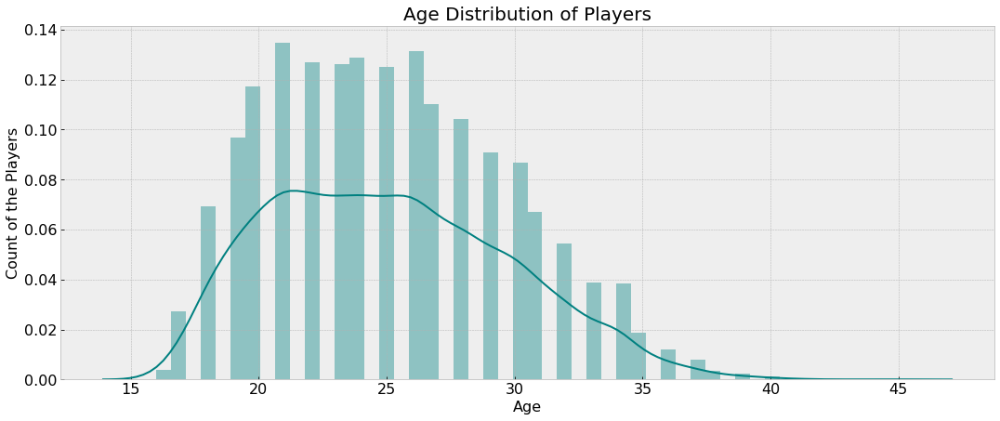

In [21]:
'''Distribution of the Age of the players'''
distplot(data['Age'], 'teal')

**Age seems to positively skewed(slightly). Most of players ages is between 20 to 30(not including 30).**

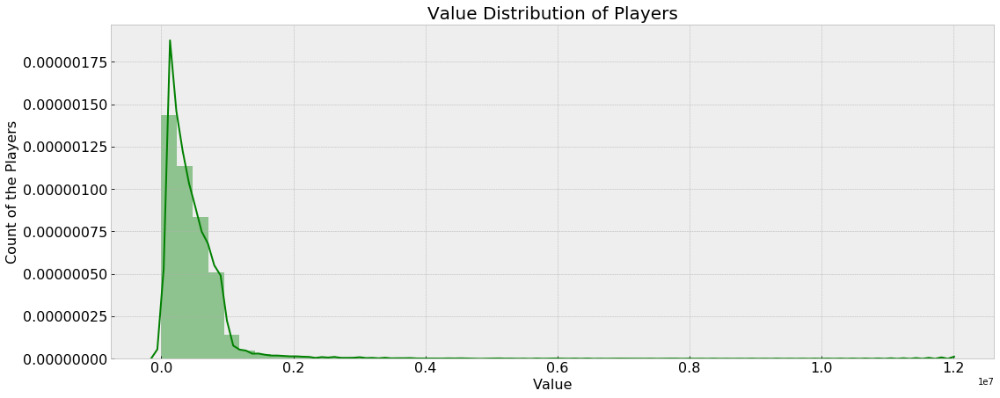

In [22]:
'''Distribution of the value of the players'''
distplot(data['Value'], 'g')

**Fare is also seems to positively skewed(hightly). Most of the player have same value and some player have extreme high values.**

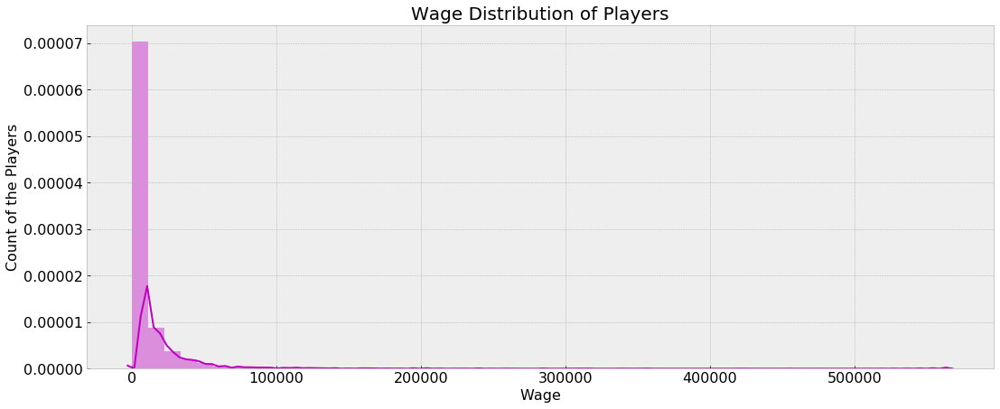

In [23]:
'''Distribution of the wage of the players'''
distplot(data['Wage'], 'm')

**Wage is also seems to positively skewed(hightly). Most of the player have same wages and some player have extreme high wages.**

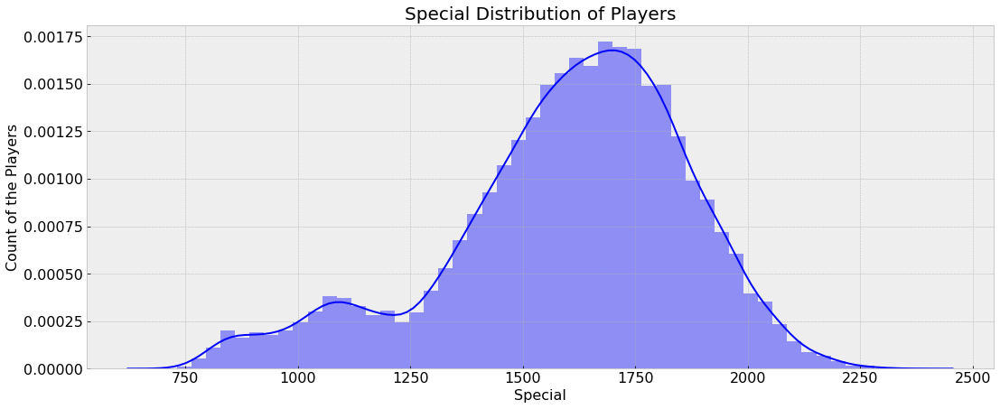

In [24]:
'''Distribution of Speciality Score of the players'''
distplot(data['Special'], 'b')

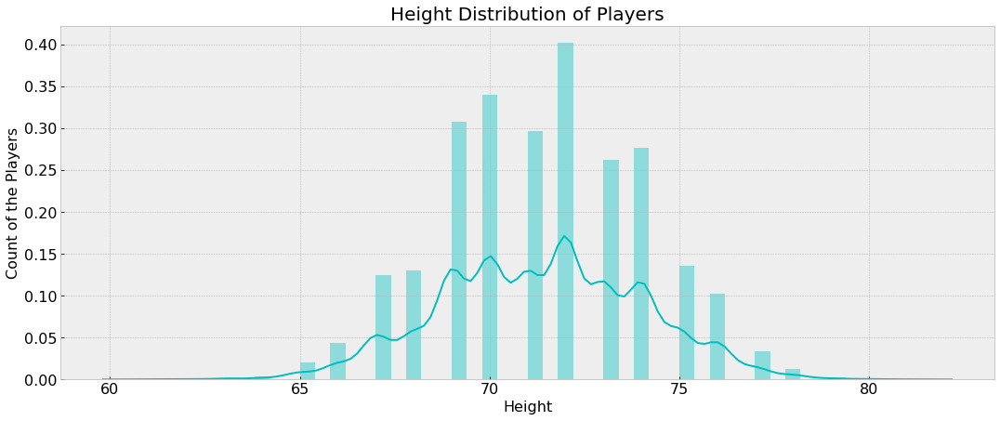

In [25]:
'''Distribution of Height of the players(In feet)'''
distplot(data['Height'], 'c')

**It's seens like height of the football player have normal distribution.**

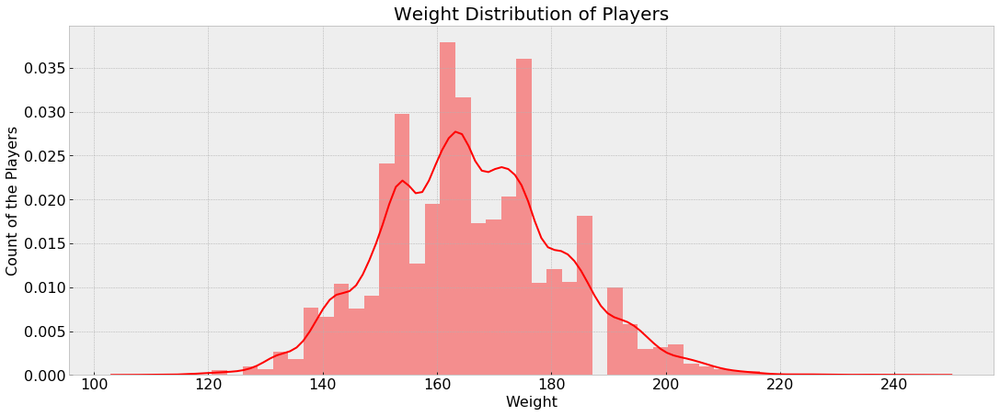

In [26]:
'''Distribution of weight of the players'''
distplot(data['Weight'], 'r')

**It's seens like normal distribution of weight among the football player.**

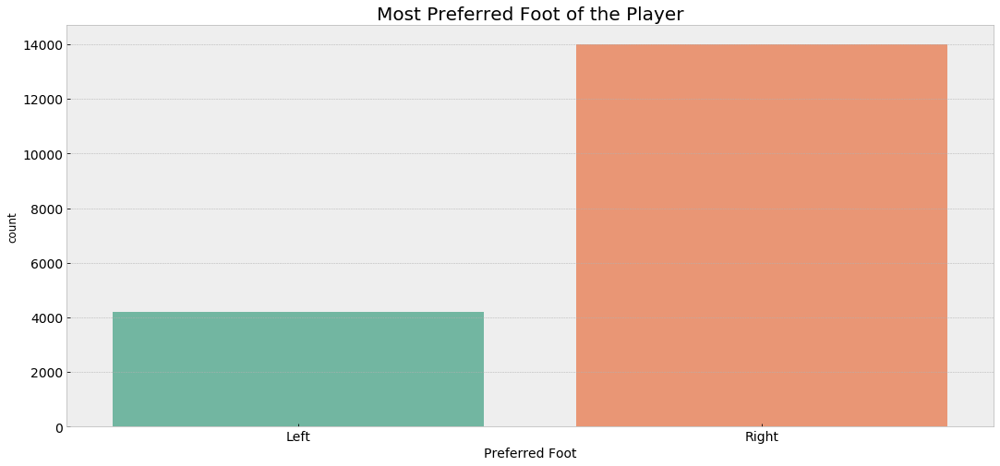

In [27]:
'''comparison of preferred foot over the different players'''
countplot(data['Preferred Foot'], 'Most Preferred Foot of the Player', 'Set2')

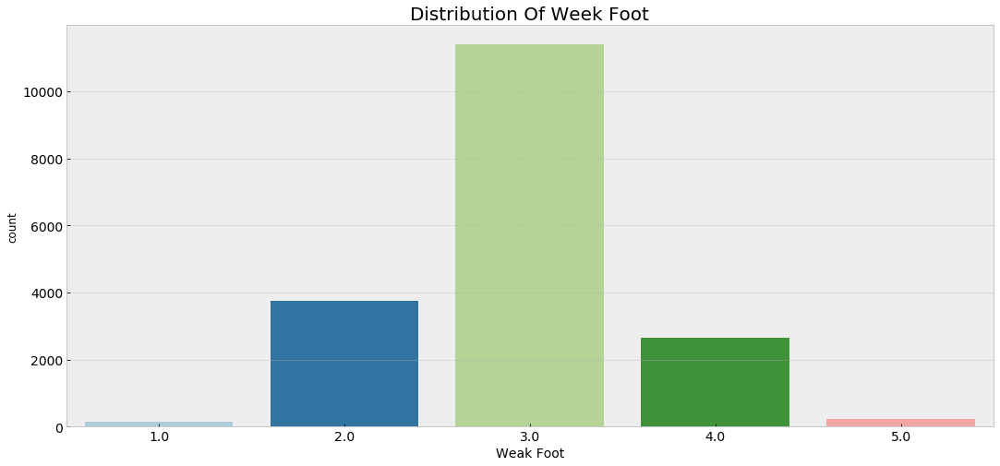

In [28]:
'''comparison of weak foot over the different players'''
countplot(data['Weak Foot'], 'Distribution Of Week Foot', 'Paired')

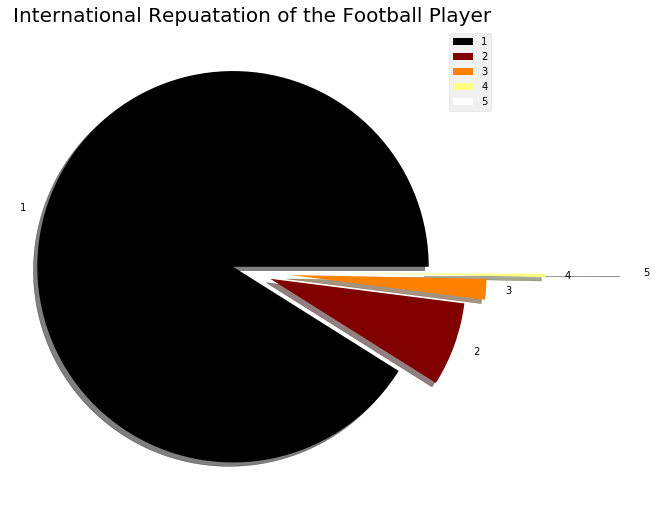

In [29]:
'''Pie chart to represent share of international repuatation'''
piechart(data['International Reputation'], 'International Repuatation of the Football Player', plt.cm.afmhot(np.linspace(0, 1, 5)))

**Only few players have high international repuatation.**

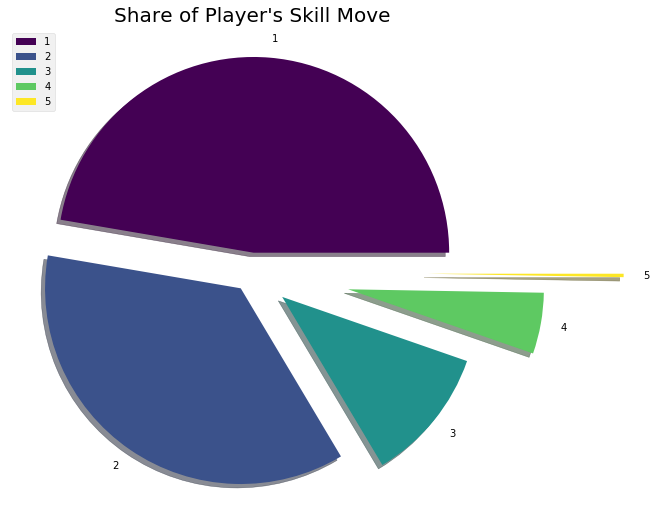

In [30]:
'''Pie chart to represent share of Player's Skill Move'''
piechart(data['Skill Moves'], "Share of Player's Skill Move", plt.cm.viridis(np.linspace(0, 1, 5)))

**Again only few players has high skill moves.**

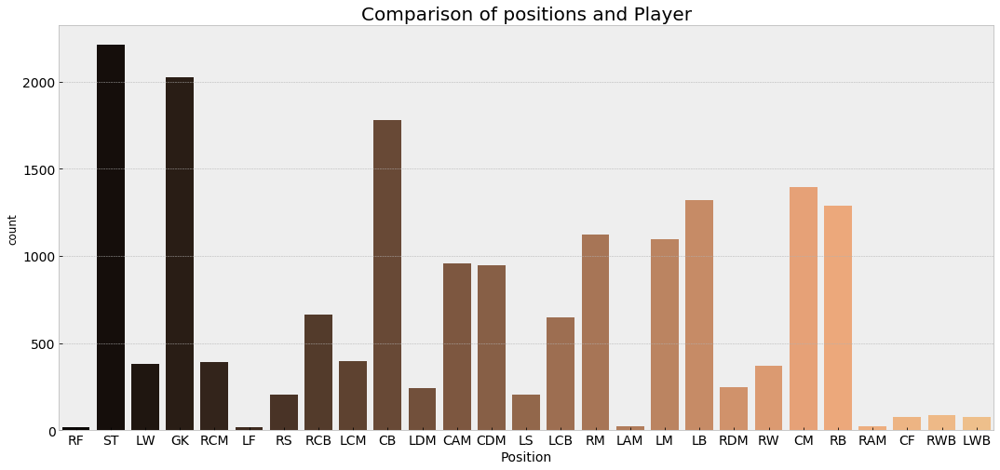

In [31]:
countplot(data['Position'],'Comparison of positions and Player', 'copper')

**Most of player playing in ST position. 'ST' position is called side midfielder, they are on the left or right-hand side of central midfield. They can also be stationed at a wider position for providing more defensive protection.**

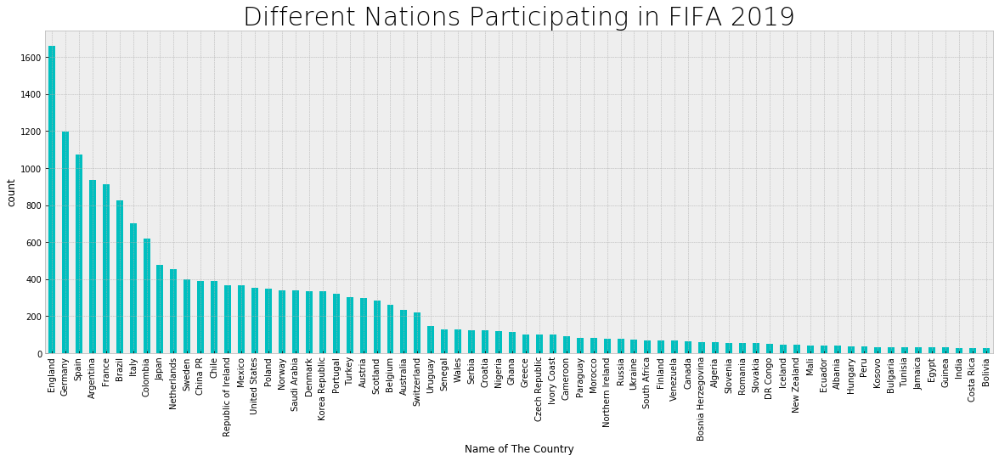

In [32]:
'''Different nations participating in the FIFA 2019'''
data['Nationality'].value_counts().head(70).plot.bar(color = 'c', figsize = (20, 7))
plt.title('Different Nations Participating in FIFA 2019', fontsize = 30, fontweight = 20)
plt.xlabel('Name of The Country')
plt.ylabel('count')
plt.show()

**Graph showing England has more player participation in FIFA 19 followed by Germany, Spain, Argentina, France, Brazil etc**

# 8. Bivariate Analysis <a id="8"></a>
***Being the most important part, bivariate analysis tries to find the relationship between two variables. We will look for correlation or association between our predictor and target variables. Bivariate analysis is performed for any combination of categorical and numerical variables. The combination can be: Numerical & Numerical, Numerical & Categorical and Categorical & Categorical.***

## 8.1 Numerical and Numerical Variable <a id="8.1"></a>
***we would try analyse the relationship between Rating and other continuous numerical variables.***

In [33]:
'''Plot regression plot to see how Rating is correlated with numerical variables.'''
corr_num = data.loc[:, ['Value', 'Wage', 'Special', 'Jersey Number', 'Height',
                        'Weight', 'General', 'Mental', 'Mobility', 'Power', 'Shooting',
                         'Passing', 'Defending', 'Goalkeeping']]
for i in corr_num.columns:
    x = corr_num[i]
    y = data['Rating']
    
    # Creating the dataset and generating the plot
    trace = go.Scatter(
                       x = x,
                       y = y,
                       mode = 'markers',
                       marker = dict(color = 'olive'))
    
    # Layout for regression plot
    title = '{} vs Rating'.format(corr_num[i].name)
    layout = go.Layout(title = title, yaxis = dict(title = 'Rating'))
    
    fig = go.Figure(data = trace, layout = layout)
    iplot(fig)

**Hmm!!! This is intesting finding,  Most of variables showing positive relationship between 'Rating' and 'Value', 'Wage', 'Special', 'General', 'Mental', 'Mobility', 'Power','Shooting', 'Passing', 'Defending', 'Goalkeeping'. But few of them showing no relationship between 'Rating and 'Jersey Number', 'Height', 'Weight.**

## 8.2 Categorical and Numerical Variable <a id="8.2"></a>
A boxplot between our numerical and categorical variables helps to reveal if the distribution of numerical variable is distinct in different classes of nominal variables. More specifically, how Rating (strongly or weakly) is associated with these categorical variables. 

In [34]:
'''Create boxplots to see the association between categorical and Rating variables.'''
corr_cat = data.loc[:, ['Preferred Foot', 'International Reputation', 'Weak Foot',
                        'Skill Moves', 'Position']]
for i in corr_cat.columns:
    trace = go.Box(
                   x = corr_cat[i],
                   y = data['Rating'],
                   marker = dict(color = 'teal'))
    layout = go.Layout(title = '{} vs Rating'. format(i), yaxis = dict(title = 'Rating'))
    fig = go.Figure(data = trace, layout = layout)
    iplot(fig)

In [35]:
'''Create bar plot to see the association between 'Name', 'Nationality', 'Club and Rating variables.'''
def bar_plot(x,y, xlabel, ylabel, label, color):
    global ax
    font_size = 16
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 7)
    ax = sns.barplot(x, y, palette = color)
    ax.set_xlabel(xlabel = xlabel, fontsize = font_size)
    ax.set_ylabel(ylabel = ylabel, fontsize = font_size)
    ax.set_title(label = label, fontsize = font_size)
    plt.show()

In [36]:
'''picking up the countries with highest number of players to compare their Rating scores'''
data['Nationality'].value_counts().head(10)

England        1662
Germany        1198
Spain          1072
Argentina       937
France          914
Brazil          827
Italy           702
Colombia        618
Japan           478
Netherlands     453
Name: Nationality, dtype: int64

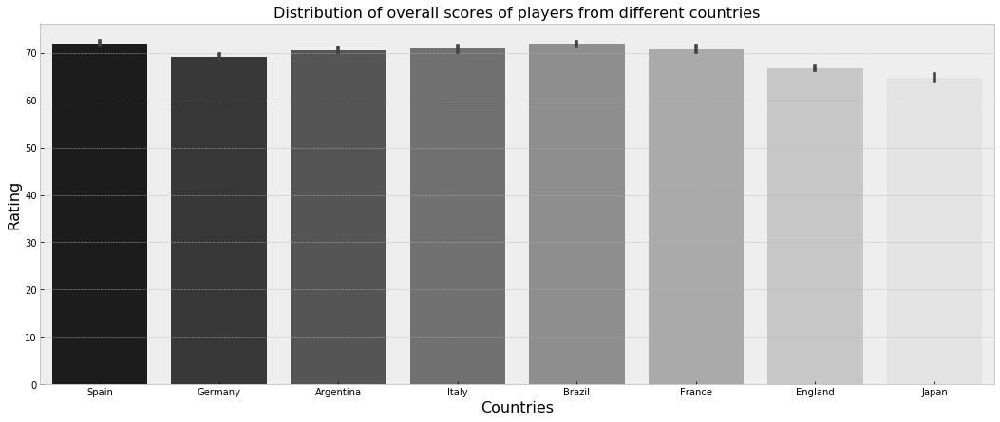

In [37]:
countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Columbia', 'Japan', 'Netherlans')
data_countries = data.loc[data['Nationality'].isin(countries) & data['Rating']]

'''Visualization'''
bar_plot(data_countries['Nationality'], data_countries['Rating'], 'Countries', 'Rating',
                    'Distribution of overall scores of players from different countries', 'binary_r')

**Spain and Brazil has most top rated player in FIFA 19**

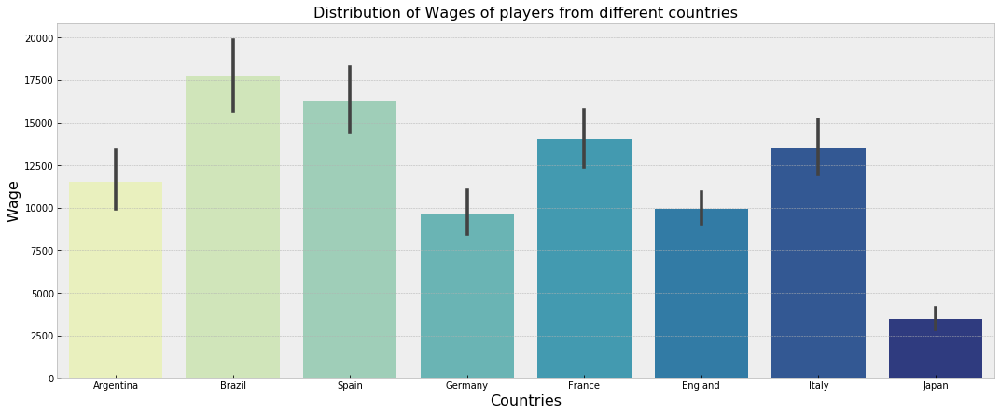

In [38]:
'''Distribution of Wages of players from different countries'''
countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Columbia', 'Japan', 'Netherlans')
data_countries = data.loc[data['Nationality'].isin(countries) & data['Wage']]

'''Visualization'''
bar_plot(data_countries['Nationality'], data_countries['Wage'], 'Countries', 'Wage',
                    'Distribution of Wages of players from different countries', 'YlGnBu')

**Player of Brazil and Spain are have highest wages.**

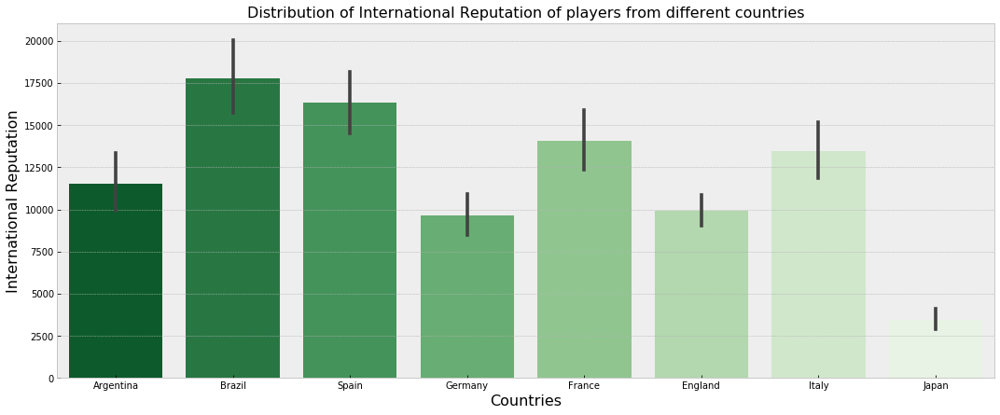

In [39]:
'''Distribution of International Reputation of players from different countries'''
countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Columbia', 'Japan', 'Netherlans')
data_countries = data.loc[data['Nationality'].isin(countries) & data['International Reputation']]

'''Visualization'''
bar_plot(data_countries['Nationality'], data_countries['Wage'], 'Countries', 'International Reputation',
                    'Distribution of International Reputation of players from different countries', 'Greens_r')

**Again! Player of Brazil and Spain are have highest international reputation.**

In [40]:
'''Clubs with highest number of players'''
data['Club'].value_counts().head(20)

No Club                    241
Southampton                 33
CD Leganés                  33
Atlético Madrid             33
Manchester City             33
Wolverhampton Wanderers     33
Everton                     33
Chelsea                     33
RC Celta                    33
Cardiff City                33
Borussia Dortmund           33
Empoli                      33
Fortuna Düsseldorf          33
Rayo Vallecano              33
Manchester United           33
Newcastle United            33
Liverpool                   33
Real Madrid                 33
Arsenal                     33
Eintracht Frankfurt         33
Name: Club, dtype: int64

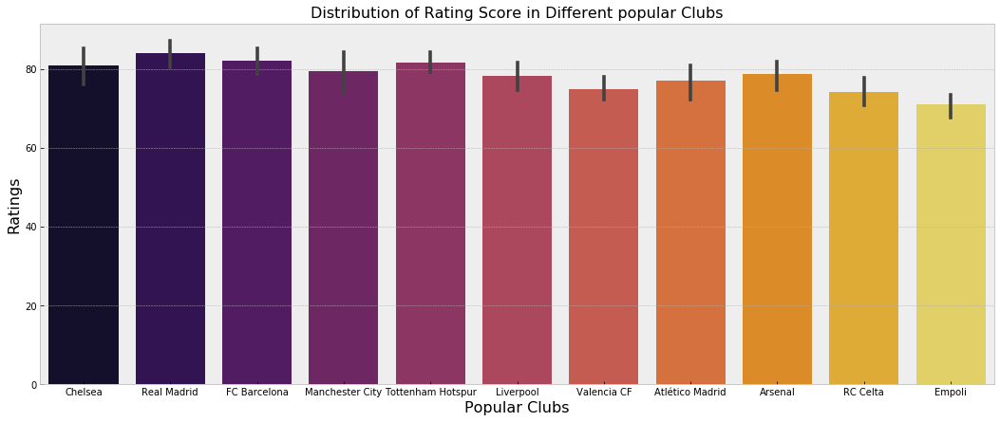

In [41]:
'''Picking up the popular clubs around the globe'''
clubs = ('Arsenal','Liverpool', 'RC Celta', 'Empoli', 'Atlético Madrid', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid')
data_clubs = data.loc[data['Club'].isin(clubs) & data['Rating']]

'''Visualization'''
bar_plot(data_clubs['Club'], data_clubs['Rating'], 'Popular Clubs','Ratings',
                'Distribution of Rating Score in Different popular Clubs', 'inferno')

**It's seems Real Madrid, FC Barcelona, Tottenham Hotspur, Chelsea have top rated players in FIFA 19**

In [42]:
'''Top Rated players in FIFA 19'''
data[data['Rating'] > 90]['Name']

0              L. Messi
1     Cristiano Ronaldo
2             Neymar Jr
3                De Gea
4          K. De Bruyne
5             E. Hazard
6             L. Modrić
7             L. Suárez
8          Sergio Ramos
9              J. Oblak
15            P. Dybala
25            K. Mbappé
Name: Name, dtype: object

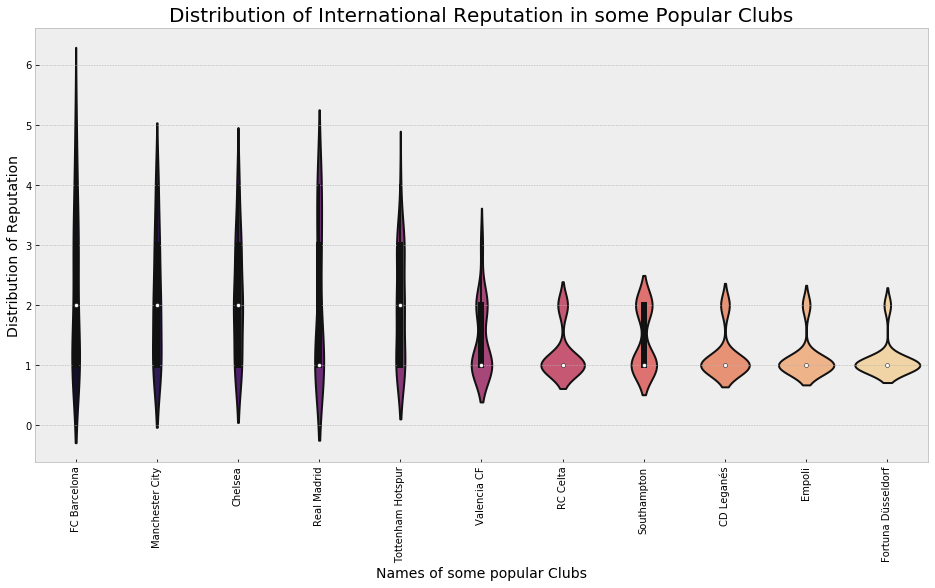

In [43]:
'''Distribution of International Reputation in some Popular clubs'''
some_clubs = ('CD Leganés', 'Southampton', 'RC Celta', 'Empoli', 'Fortuna Düsseldorf', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid')

data_club = data.loc[data['Club'].isin(some_clubs) & data['International Reputation']]

plt.rcParams['figure.figsize'] = (16, 8)
ax = sns.violinplot(x = 'Club', y = 'International Reputation', data = data_club, palette = 'magma')
ax.set_xlabel(xlabel = 'Names of some popular Clubs', fontsize = 14)
ax.set_ylabel(ylabel = 'Distribution of Reputation', fontsize = 14)
ax.set_title(label = 'Distribution of International Reputation in some Popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

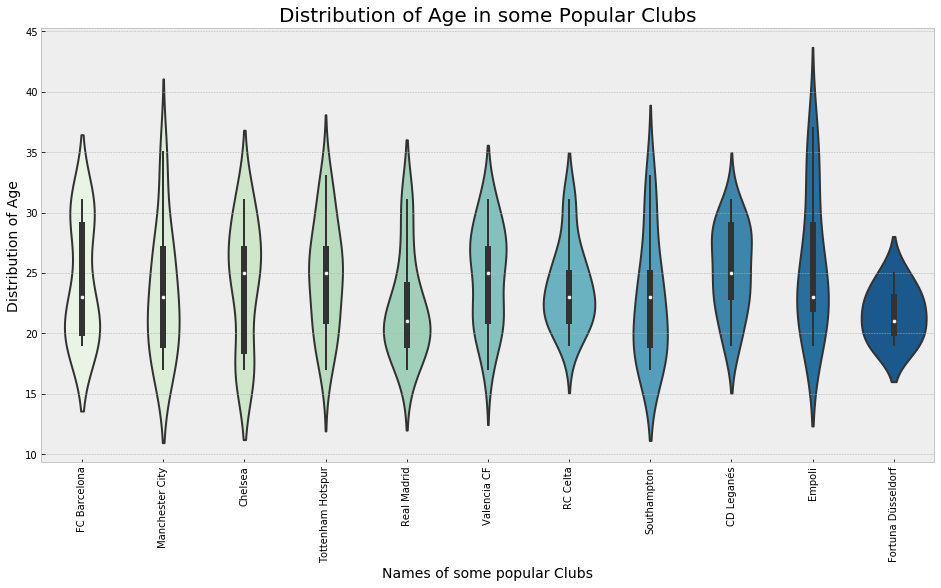

In [44]:
'''Distribution of Age in some Popular clubs'''
some_clubs = ('CD Leganés', 'Southampton', 'RC Celta', 'Empoli', 'Fortuna Düsseldorf', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid')

data_club = data.loc[data['Club'].isin(some_clubs) & data['Age']]

plt.rcParams['figure.figsize'] = (16, 8)
ax = sns.violinplot(x = 'Club', y = 'Age', data = data_club, palette = 'GnBu')
ax.set_xlabel(xlabel = 'Names of some popular Clubs', fontsize = 14)
ax.set_ylabel(ylabel = 'Distribution of Age', fontsize = 14)
ax.set_title(label = 'Distribution of Age in some Popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

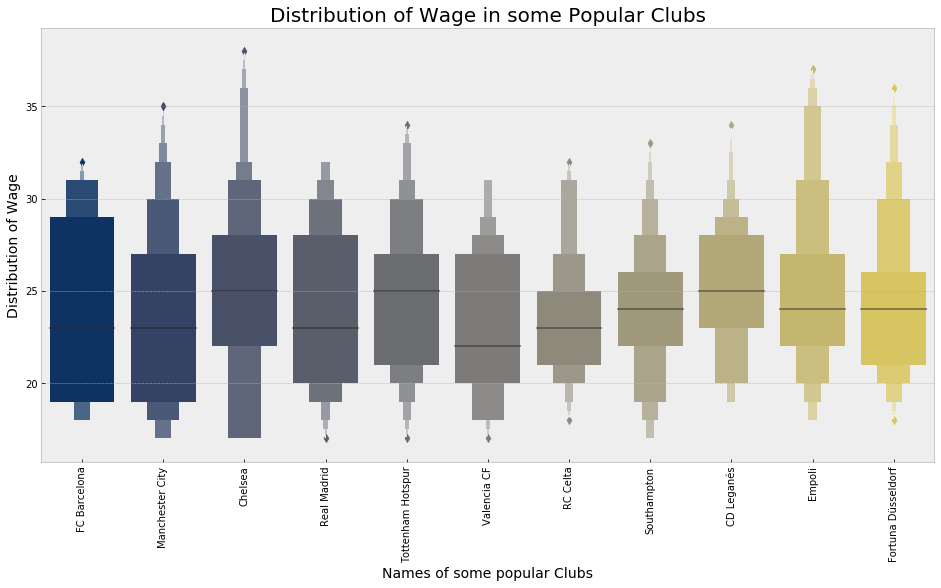

In [45]:
'''Distribution of wage in some Popular clubs'''
some_clubs = ('CD Leganés', 'Southampton', 'RC Celta', 'Empoli', 'Fortuna Düsseldorf', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid')

data_club = data.loc[data['Club'].isin(some_clubs) & data['Wage']]

plt.rcParams['figure.figsize'] = (16, 8)
ax = sns.boxenplot(x = 'Club', y = 'Age', data = data_club, palette = 'cividis')
ax.set_xlabel(xlabel = 'Names of some popular Clubs', fontsize = 14)
ax.set_ylabel(ylabel = 'Distribution of Wage', fontsize = 14)
ax.set_title(label = 'Distribution of Wage in some Popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

# 9 .Multivariate Analysis <a id="9"></a>
***In multivariate analysis, we try to find the relationship among more than two variables. Number of predictor variable in bivariate analysis was one. On the contrary, number of predictor variables for multivariate analysis are more than one.***

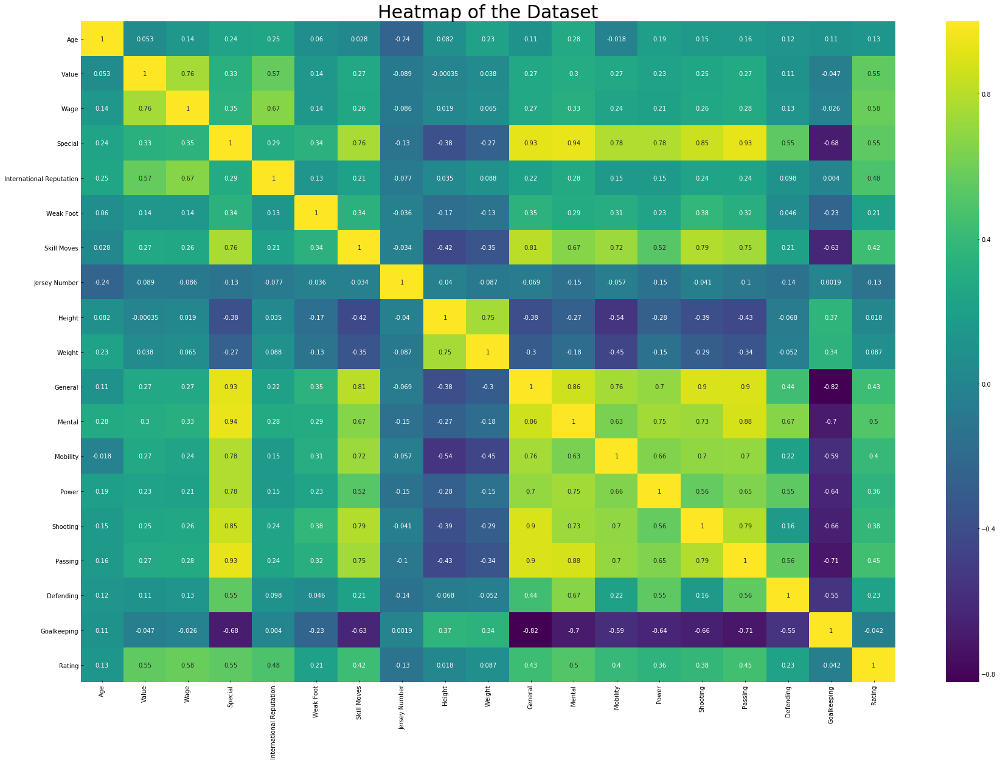

In [46]:
''' Plotting a correlation heatmap'''
plt.rcParams['figure.figsize'] = (30, 20)
sns.heatmap(data.corr(), annot = True, cmap = 'viridis')
plt.title('Heatmap of the Dataset', fontsize = 30)
plt.show()

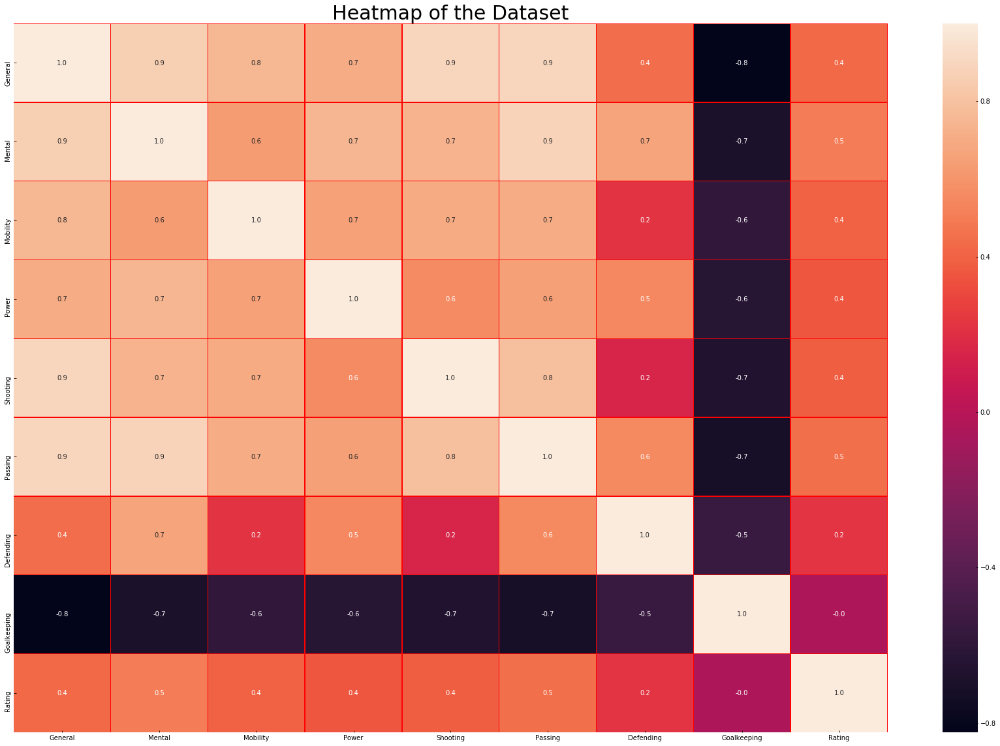

In [47]:
plt.rcParams['figure.figsize'] = (30, 20)
sns.heatmap(data[['General', 'Mental', 'Mobility', 'Power', 'Shooting',
       'Passing', 'Defending', 'Goalkeeping', 'Rating']].corr(), annot=True, linewidths=0.5,linecolor="red", fmt= '.1f')
plt.title('Heatmap of the Dataset', fontsize = 30)
plt.show()

/opt/conda/lib/python3.6/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



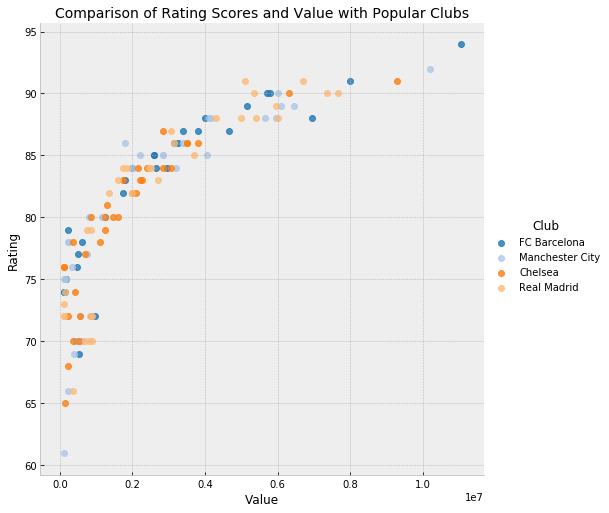

In [48]:
'''Comparison of rating scores and value with popular clubs'''
clubs = ('Manchester City', 'FC Barcelona',  'Chelsea', 'Real Madrid')

sns.lmplot(x='Value', y='Rating', hue='Club', palette =  'tab20',
           data=data.loc[data['Club'].isin(clubs)], 
           fit_reg=False, size = 7)
plt.title('Comparison of Rating Scores and Value with Popular Clubs', fontsize = 14)
plt.show()

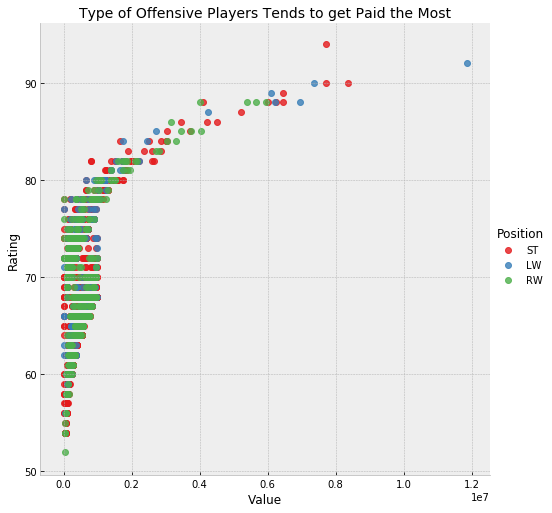

In [49]:
'''Type of Offensive Players Tends to get Paid the Most'''
sns.lmplot(x='Value', y='Rating', hue='Position', palette =  'Set1',
           data=data.loc[data['Position'].isin(['ST', 'RW', 'LW'])], 
           fit_reg=False, size = 7)
plt.title('Type of Offensive Players Tends to get Paid the Most', fontsize = 14)
plt.show()

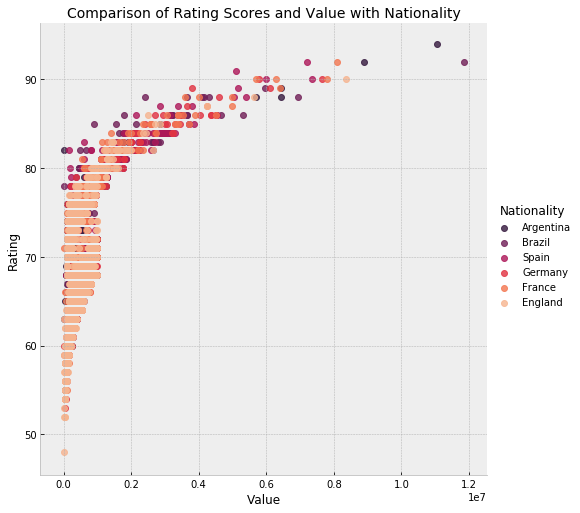

In [50]:
'''Comparison of rating scores and value with Nationality'''
countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil')

sns.lmplot(x='Value', y='Rating', hue ='Nationality', palette =  'rocket',
           data=data.loc[data['Nationality'].isin(countries)], 
           fit_reg=False, size = 7)
plt.title('Comparison of Rating Scores and Value with Nationality', fontsize = 14)
plt.show()

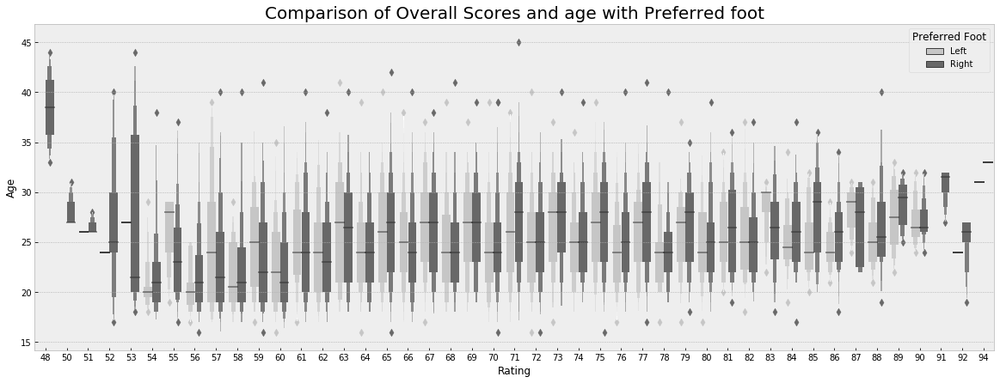

In [51]:
'''Comparison of Rating Scores and age with Preferred foot'''
plt.rcParams['figure.figsize'] = (20, 7)
plt.style.use('seaborn-dark-palette')

sns.boxenplot(data['Rating'], data['Age'], hue = data['Preferred Foot'], palette = 'Greys')
plt.title('Comparison of Overall Scores and age with Preferred foot', fontsize = 20)
plt.show()

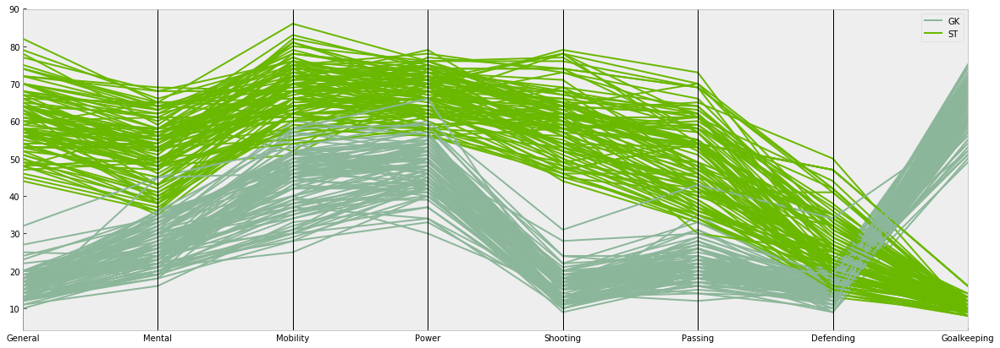

In [52]:
from pandas.plotting import parallel_coordinates

'''Comparition between ST and GK Positions based on Player feature'''
p = (
    data.iloc[:, 16:-1]
        .loc[data['Position'].isin(['ST', 'GK'])])

p['Position'] = data['Position']
p = p.sample(200)
plt.rcParams['figure.figsize'] = (20, 7)
parallel_coordinates(p, 'Position')

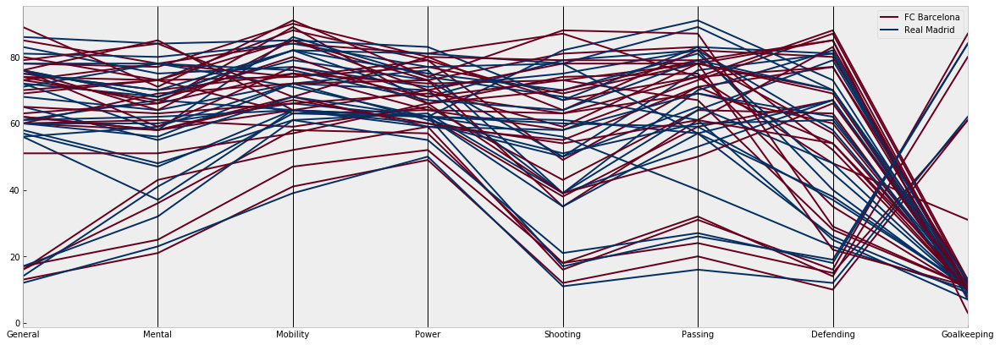

In [53]:
'''Comparition between FC Barcelona and FC Barcelona based on Player feature'''
p = (
    data.iloc[:, 16:-1]
        .loc[data['Club'].isin(['FC Barcelona', 'Real Madrid'])])

p['Club'] = data['Club']
p = p.sample(50)
plt.rcParams['figure.figsize'] = (20, 7)
parallel_coordinates(p, 'Club', colormap = 'RdBu')

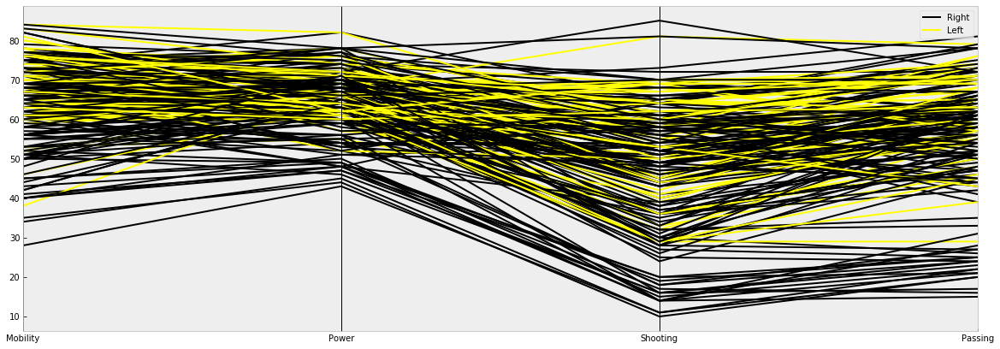

In [54]:
'''Comparition between left and right foot based on Player feature'''
p = (
    data.iloc[:, 18:-3]
        .loc[data['Preferred Foot'].isin(['Left', 'Right'])])

p['Preferred Foot'] = data['Preferred Foot']
p = p.sample(200)
plt.rcParams['figure.figsize'] = (20, 7)
parallel_coordinates(p, 'Preferred Foot', colormap = 'gnuplot')

# 10. Top 10 Players <a id="10"></a>

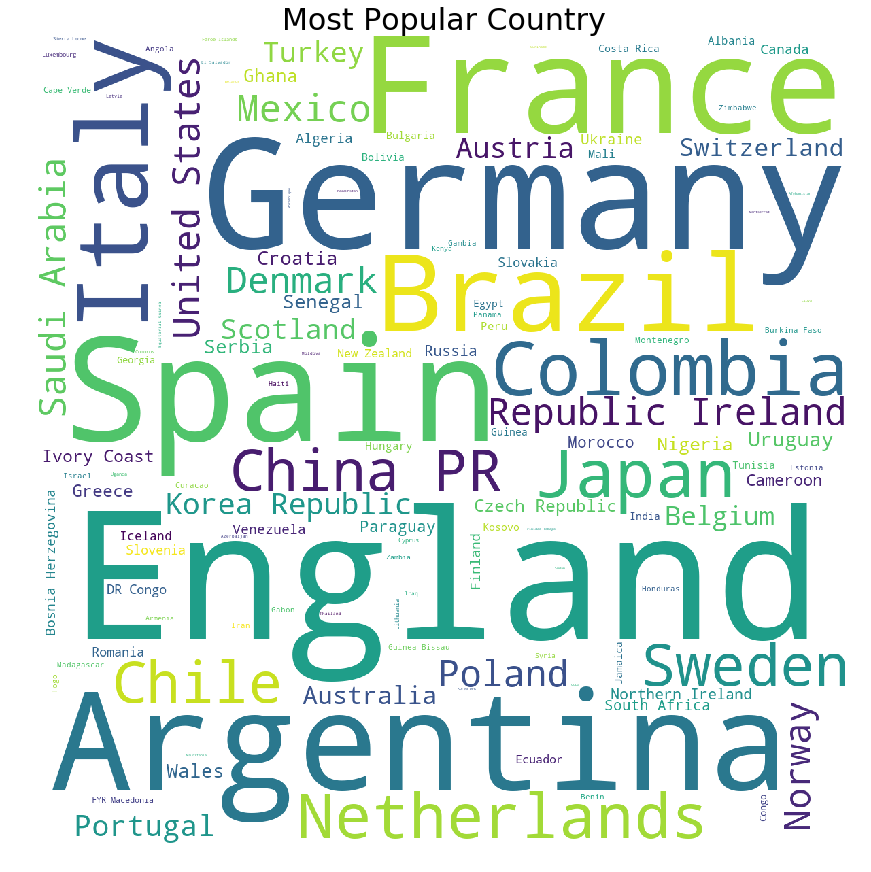

In [55]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.rcParams['figure.figsize'] = (15, 15)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(' '.join(data['Nationality']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Country',fontsize = 30)
plt.show()

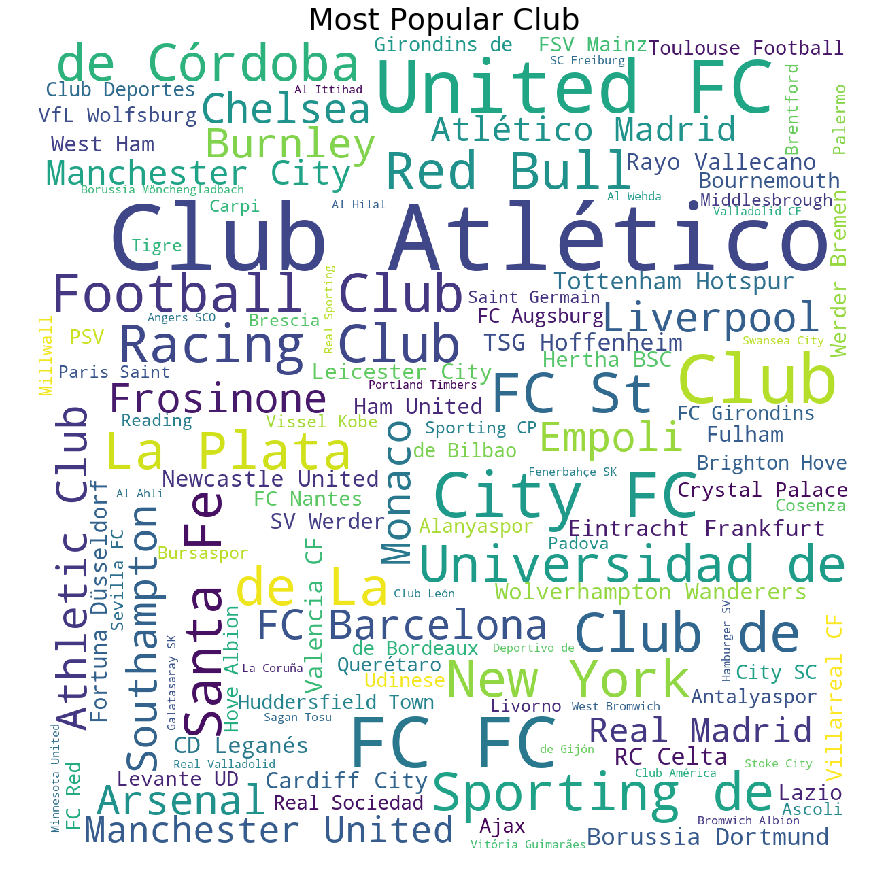

In [56]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.rcParams['figure.figsize'] = (15, 15)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(' '.join(data['Club']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Club',fontsize = 30)
plt.show()

In [57]:
'''Best players per each position with their age, club, and nationality based on their overall scores'''

fifa19.iloc[fifa19.groupby(data['Position'])['Overall'].idxmax()][['Position', 'Name', 'Age', 'Club', 'Nationality']]

,Position,Name,Age,Club,Nationality
17,CAM,A. Griezmann,27,Atlético Madrid,France
12,CB,D. Godín,32,Atlético Madrid,Uruguay
20,CDM,Sergio Busquets,29,FC Barcelona,Spain
271,CF,Luis Alberto,25,Lazio,Spain
67,CM,Thiago,27,FC Bayern München,Spain
3,GK,De Gea,27,Manchester United,Spain
28,LAM,J. Rodríguez,26,FC Bayern München,Colombia
35,LB,Marcelo,30,Real Madrid,Brazil
24,LCB,G. Chiellini,33,Juventus,Italy
11,LCM,T. Kroos,28,Real Madrid,Germany


In [58]:
'''Best players from each positions with their age, nationality, club based on their potential scores'''

fifa19.iloc[fifa19.groupby(data['Position'])['Potential'].idxmax()][['Position', 'Name', 'Age', 'Club', 'Nationality']]

,Position,Name,Age,Club,Nationality
31,CAM,C. Eriksen,26,Tottenham Hotspur,Denmark
42,CB,S. Umtiti,24,FC Barcelona,France
27,CDM,Casemiro,26,Real Madrid,Brazil
350,CF,A. Milik,24,Napoli,Poland
78,CM,S. Milinković-Savić,23,Lazio,Serbia
3,GK,De Gea,27,Manchester United,Spain
28,LAM,J. Rodríguez,26,FC Bayern München,Colombia
35,LB,Marcelo,30,Real Madrid,Brazil
77,LCB,M. Škriniar,23,Inter,Slovakia
11,LCM,T. Kroos,28,Real Madrid,Germany


In [59]:
'''Top 10 player of FIFA 19 based on rating'''

data[data['Rating'] > 90][['Name', 'Age', 'Club', 'Nationality']]

,Name,Age,Club,Nationality
0,L. Messi,31,FC Barcelona,Argentina
1,Cristiano Ronaldo,33,Juventus,Portugal
2,Neymar Jr,26,Paris Saint-Germain,Brazil
3,De Gea,27,Manchester United,Spain
4,K. De Bruyne,27,Manchester City,Belgium
5,E. Hazard,27,Chelsea,Belgium
6,L. Modrić,32,Real Madrid,Croatia
7,L. Suárez,31,FC Barcelona,Uruguay
8,Sergio Ramos,32,Real Madrid,Spain
9,J. Oblak,25,Atlético Madrid,Slovenia


In [60]:
'''Top 10 youngest player from FIFA 19'''

data.sort_values('Age', ascending = True)[['Name', 'Age', 'Club', 'Nationality']].head(11)

,Name,Age,Club,Nationality
18206,G. Nugent,16,Tranmere Rovers,England
17743,J. Olstad,16,Sarpsborg 08 FF,Norway
13293,H. Massengo,16,AS Monaco,France
16081,J. Italiano,16,Perth Glory,Australia
18166,N. Ayéva,16,Örebro SK,Sweden
17712,K. Broda,16,Wisła Kraków,Poland
17354,L. D'Arrigo,16,Adelaide United,Australia
13567,Y. Verschaeren,16,RSC Anderlecht,Belgium
16927,B. Nygren,16,IFK Göteborg,Sweden
18018,B. O'Gorman,16,Bray Wanderers,Republic of Ireland


In [61]:
'''Top 10 eldest player from FIFA 19'''

data.sort_values('Age', ascending = False)[['Name', 'Age', 'Club', 'Nationality']].head(11)

,Name,Age,Club,Nationality
4741,O. Pérez,45,Pachuca,Mexico
18183,K. Pilkington,44,Cambridge United,England
17726,T. Warner,44,Accrington Stanley,Trinidad & Tobago
10545,S. Narazaki,42,Nagoya Grampus,Japan
7225,C. Muñoz,41,CD Universidad de Concepción,Argentina
1120,J. Villar,41,No Club,Paraguay
12192,H. Sulaimani,41,Ohod Club,Saudi Arabia
15426,M. Tyler,41,Peterborough United,England
4228,B. Nivet,41,ESTAC Troyes,France
10356,F. Kippe,40,Lillestrøm SK,Norway


In [62]:
'''Top 10 left footed footballer'''

data[data['Preferred Foot'] == 'Left'][['Name', 'Age', 'Club', 'Nationality']].head(11)

,Name,Age,Club,Nationality
0,L. Messi,31,FC Barcelona,Argentina
13,David Silva,32,Manchester City,Spain
15,P. Dybala,24,Juventus,Argentina
17,A. Griezmann,27,Atlético Madrid,France
19,T. Courtois,26,Real Madrid,Belgium
24,G. Chiellini,33,Juventus,Italy
26,M. Salah,26,Liverpool,Egypt
28,J. Rodríguez,26,FC Bayern München,Colombia
35,Marcelo,30,Real Madrid,Brazil
36,G. Bale,28,Real Madrid,Wales


In [63]:
'''Top 10 Right footed footballers'''

data[data['Preferred Foot'] == 'Right'][['Name', 'Age', 'Club', 'Nationality']].head(11)

,Name,Age,Club,Nationality
1,Cristiano Ronaldo,33,Juventus,Portugal
2,Neymar Jr,26,Paris Saint-Germain,Brazil
3,De Gea,27,Manchester United,Spain
4,K. De Bruyne,27,Manchester City,Belgium
5,E. Hazard,27,Chelsea,Belgium
6,L. Modrić,32,Real Madrid,Croatia
7,L. Suárez,31,FC Barcelona,Uruguay
8,Sergio Ramos,32,Real Madrid,Spain
9,J. Oblak,25,Atlético Madrid,Slovenia
10,R. Lewandowski,29,FC Bayern München,Poland


In [64]:
'''Ploting the location based on Rating'''
rating = pd.DataFrame(data.groupby(['Nationality'])['Rating'].sum().reset_index())
count = pd.DataFrame(rating.groupby('Nationality')['Rating'].sum().reset_index())

trace = [go.Choropleth(
            colorscale = 'plasma',
            locationmode = 'country names',
            locations = count['Nationality'],
            text = count['Nationality'],
            z = count['Rating'],
            reversescale=True)]

layout = go.Layout(title = 'Country vs Ratings')

fig = go.Figure(data = trace, layout = layout)
py.iplot(fig)

In [65]:
'''Ploting the location based on Shooting'''
rating = pd.DataFrame(data.groupby(['Nationality'])['Shooting'].sum().reset_index())
count = pd.DataFrame(rating.groupby('Nationality')['Shooting'].sum().reset_index())

trace = [go.Choropleth(
            colorscale = 'viridis',
            locationmode = 'country names',
            locations = count['Nationality'],
            text = count['Nationality'],
            z = count['Shooting'],
            reversescale=True)]

layout = go.Layout(title = 'Country vs Shooting')

fig = go.Figure(data = trace, layout = layout)
py.iplot(fig)

In [66]:
'''Ploting the location based on Defending'''
rating = pd.DataFrame(data.groupby(['Nationality'])['Defending'].sum().reset_index())
count = pd.DataFrame(rating.groupby('Nationality')['Defending'].sum().reset_index())

trace = [go.Choropleth(
            colorscale = 'magma',
            locationmode = 'country names',
            locations = count['Nationality'],
            text = count['Nationality'],
            z = count['Defending'],
            reversescale=True)]

layout = go.Layout(title = 'Country vs Defending')

fig = go.Figure(data = trace, layout = layout)
py.iplot(fig)

# 11. References <a id="11"></a>

1. https://pandas.pydata.org/pandasdocs/stable/reference/api/pandas.plotting.parallel_coordinates.html
2. https://plot.ly/python/choropleth-maps/
3. https://www.kaggle.com/roshansharma/fifa-data-visualization
4. https://www.kaggle.com/thebrownviking20/intermediate-visualization-tutorial-using-plotly
5. https://www.kaggle.com/residentmario/multivariate-plotting
6. https://www.kaggle.com/crazydiv/fifa-player-analysis-with-plotly
7. https://www.kaggle.com/kanncaa1/plotly-tutorial-for-beginners
8. https://plot.ly/python/line-and-scatter

# ***Thank You for Reading the Kernel!***

# IF YOU FIND THIS KERNEL HELPFUL, SOME UPVOTES WILL BE APPRECIATED.